#### __Irura Jackson Mwongera  Project__

## __Problem Statement__

Customer churn poses a significant challenge for businesses, as retaining existing customers is often more cost-effective than acquiring new ones. With a large dataset containing 440,882 customer records, this project seeks to predict customer churn by leveraging detailed customer information, such as age, gender, tenure, usage frequency, support calls, payment delay, subscription type, contract length, total spend, and last interaction.



## **The goal is to build two predictive models:**


1. A Logistic Regression model that will classify whether a customer is likely to churn (1) or stay (0) based on their individual attributes, identifying the most influential factors in churn likelihood.

2. A Decision Tree model that segments customers into distinct groups based on their churn probability, providing interpretable, rule-based insights into the characteristics of at-risk customers.
Through these models, businesses will be able to proactively identify customers most likely to leave, allowing for targeted retention strategies to improve customer satisfaction, reduce churn rates, and optimize revenue.

## __Data explanations__

Customer churn refers to the phenomenon where customers discontinue their relationship or subscription with a company or service provider. It represents the rate at which customers stop using a company's products or services within a specific period. Churn is an important metric for businesses as it directly impacts revenue, growth, and customer retention.

In the context of the Churn dataset, the churn label indicates whether a customer has churned or not. A churned customer is one who has decided to discontinue their subscription or usage of the company's services. On the other hand, a non-churned customer is one who continues to remain engaged and retains their relationship with the company.

Understanding customer churn is crucial for businesses to identify patterns, factors, and indicators that contribute to customer attrition. By analyzing churn behavior and its associated features, companies can develop strategies to retain existing customers, improve customer satisfaction, and reduce customer turnover.

This training file for the CHURN dataset contains a collection of 440882 customer records along with their respective features and churn labels.  Each record in the training file represents a customer and includes features such as age, gender, tenure, usage frequency, support calls, payment delay, subscription type, contract length, total spend, and last interaction. The churn label indicates whether the customer has churned (1) or not (0).

### __*I begin by installing the required libraries.*__

In [1]:
!pip install numpy pandas-profiling matplotlib seaborn --quiet

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.6/390.6 kB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 61.3 MB/s eta 0:00:00


In [2]:
!pip install opendatasets --upgrade --quiet

In [3]:
import os
import opendatasets as od
import pandas as pd
pd.set_option("display.max_columns", 120)
pd.set_option("display.max_rows", 120)

In [4]:
od.download('https://www.kaggle.com/datasets/muhammadshahidazeem/customer-churn-dataset')

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: irurajack
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/muhammadshahidazeem/customer-churn-dataset


100%|██████████| 6.66M/6.66M [00:01<00:00, 6.54MB/s]


In [5]:
os.listdir('customer-churn-dataset')

['customer_churn_dataset-testing-master.csv',
 'customer_churn_dataset-training-master.csv']

In [6]:
customer_df = pd.read_csv('./customer-churn-dataset/customer_churn_dataset-training-master.csv', low_memory=False)

In [7]:
customer_df

,CustomerID,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn
0,2.0,30.0,Female,39.0,14.0,5.0,18.0,Standard,Annual,932.00,17.0,1.0
1,3.0,65.0,Female,49.0,1.0,10.0,8.0,Basic,Monthly,557.00,6.0,1.0
2,4.0,55.0,Female,14.0,4.0,6.0,18.0,Basic,Quarterly,185.00,3.0,1.0
3,5.0,58.0,Male,38.0,21.0,7.0,7.0,Standard,Monthly,396.00,29.0,1.0
4,6.0,23.0,Male,32.0,20.0,5.0,8.0,Basic,Monthly,617.00,20.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
440828,449995.0,42.0,Male,54.0,15.0,1.0,3.0,Premium,Annual,716.38,8.0,0.0
440829,449996.0,25.0,Female,8.0,13.0,1.0,20.0,Premium,Annual,745.38,2.0,0.0
440830,449997.0,26.0,Male,35.0,27.0,1.0,5.0,Standard,Quarterly,977.31,9.0,0.0
440831,449998.0,28.0,Male,55.0,14.0,2.0,0.0,Standard,Quarterly,602.55,2.0,0.0


### __*let me check data types*__

In [8]:
customer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440833 entries, 0 to 440832
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   CustomerID         440832 non-null  float64
 1   Age                440832 non-null  float64
 2   Gender             440832 non-null  object 
 3   Tenure             440832 non-null  float64
 4   Usage Frequency    440832 non-null  float64
 5   Support Calls      440832 non-null  float64
 6   Payment Delay      440832 non-null  float64
 7   Subscription Type  440832 non-null  object 
 8   Contract Length    440832 non-null  object 
 9   Total Spend        440832 non-null  float64
 10  Last Interaction   440832 non-null  float64
 11  Churn              440832 non-null  float64
dtypes: float64(9), object(3)
memory usage: 40.4+ MB


In [9]:
# Fill missing values in the 'Churn' column with the most repeated value (mode)
customer_df['Churn'] = customer_df['Churn'].fillna(customer_df['Churn'].mode()[0])


### It seems that my dataframe has equal columns 440832 rows

## __Let me do feature Engineering.__

### _By Combining Usage Frequency with Support Calls could indicate customer engagement or dissatisfaction levels._

In [10]:
import numpy as np

In [11]:
customer_df['Interaction Rate'] = customer_df['Support Calls'] / customer_df['Usage Frequency'].replace(0, np.nan)

In [12]:
customer_df['Interaction Rate']

,Interaction Rate
0,0.357143
1,10.000000
2,1.500000
3,0.333333
4,0.250000
...,...
440828,0.066667
440829,0.076923
440830,0.037037
440831,0.142857


## __Let me categorizing Interaction Rate into bins.__

In [13]:
def categorize_interaction_rate(rate):
    if pd.isna(rate):
        return 'Undefined'
    elif rate <= 0.5:
        return 'Low'
    elif rate <= 1.5:
        return 'Medium'
    else:
        return 'High'

customer_df['Interaction Rate Category'] = customer_df['Interaction Rate'].apply(categorize_interaction_rate)


In [14]:
customer_df

,CustomerID,Age,Gender,Tenure,Usage Frequency,Support Calls,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn,Interaction Rate,Interaction Rate Category
0,2.0,30.0,Female,39.0,14.0,5.0,18.0,Standard,Annual,932.00,17.0,1.0,0.357143,Low
1,3.0,65.0,Female,49.0,1.0,10.0,8.0,Basic,Monthly,557.00,6.0,1.0,10.000000,High
2,4.0,55.0,Female,14.0,4.0,6.0,18.0,Basic,Quarterly,185.00,3.0,1.0,1.500000,Medium
3,5.0,58.0,Male,38.0,21.0,7.0,7.0,Standard,Monthly,396.00,29.0,1.0,0.333333,Low
4,6.0,23.0,Male,32.0,20.0,5.0,8.0,Basic,Monthly,617.00,20.0,1.0,0.250000,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440828,449995.0,42.0,Male,54.0,15.0,1.0,3.0,Premium,Annual,716.38,8.0,0.0,0.066667,Low
440829,449996.0,25.0,Female,8.0,13.0,1.0,20.0,Premium,Annual,745.38,2.0,0.0,0.076923,Low
440830,449997.0,26.0,Male,35.0,27.0,1.0,5.0,Standard,Quarterly,977.31,9.0,0.0,0.037037,Low
440831,449998.0,28.0,Male,55.0,14.0,2.0,0.0,Standard,Quarterly,602.55,2.0,0.0,0.142857,Low


### __Let me delete column Usage Frequency,Support Calls and Interaction Rate Since I have Interaction Rate Category.__

In [15]:
customer_df.drop(['Usage Frequency', 'Support Calls', 'Interaction Rate'], axis=1, inplace=True)

In [16]:
customer_df.head()

,CustomerID,Age,Gender,Tenure,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Churn,Interaction Rate Category
0,2.0,30.0,Female,39.0,18.0,Standard,Annual,932.0,17.0,1.0,Low
1,3.0,65.0,Female,49.0,8.0,Basic,Monthly,557.0,6.0,1.0,High
2,4.0,55.0,Female,14.0,18.0,Basic,Quarterly,185.0,3.0,1.0,Medium
3,5.0,58.0,Male,38.0,7.0,Standard,Monthly,396.0,29.0,1.0,Low
4,6.0,23.0,Male,32.0,8.0,Basic,Monthly,617.0,20.0,1.0,Low


### __*Let me divide my dataframe into train_df 60%,test_df 20% and val_df 20%*__



In [17]:
!pip install scikit-learn --upgrade --quiet

In [18]:
from sklearn.model_selection import train_test_split

In [19]:
train_val_df, test_df = train_test_split(customer_df, test_size=0.2, random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.25, random_state=42)


In [20]:
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (264499, 11)
val_df.shape : (88167, 11)
test_df.shape : (88167, 11)


### __*Let me Identifying Input and Target Columns*__

In [21]:
input_cols = [col for col in train_df.columns if col != 'Churn']
target_col = 'Churn'

In [22]:
input_cols

['CustomerID',
 'Age',
 'Gender',
 'Tenure',
 'Payment Delay',
 'Subscription Type',
 'Contract Length',
 'Total Spend',
 'Last Interaction',
 'Interaction Rate Category']

In [23]:
target_col

'Churn'

In [24]:
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_col].copy()

In [25]:
val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_col].copy()

In [26]:
test_inputs = test_df[input_cols].copy()
test_targets = test_df[target_col].copy()

### __*Let's me identify which of the columns are numerical and which ones are categorical for encoding.*__

In [27]:
!pip install numpy --quiet

In [28]:
import numpy as np

In [29]:
numeric_cols = [col for col in train_inputs.select_dtypes(include=np.number).columns if col != 'Churn']
categorical_cols =train_inputs.select_dtypes('object').columns.tolist()

In [30]:
numeric_cols

['CustomerID',
 'Age',
 'Tenure',
 'Payment Delay',
 'Total Spend',
 'Last Interaction']

In [31]:
categorical_cols

['Gender', 'Subscription Type', 'Contract Length', 'Interaction Rate Category']

### __*Let's me view statistics for the numeric columns.*__

In [32]:
train_inputs[numeric_cols].describe()

,CustomerID,Age,Tenure,Payment Delay,Total Spend,Last Interaction
count,264499.000000,264499.000000,264499.000000,264499.000000,264499.000000,264499.000000
mean,225278.106503,39.360168,31.249203,12.977077,631.543645,14.484671
std,129530.298715,12.445990,17.259622,8.260868,241.072287,8.598874
min,2.000000,18.000000,1.000000,0.000000,100.000000,1.000000
25%,113370.000000,29.000000,16.000000,6.000000,479.985000,7.000000
50%,225979.000000,39.000000,32.000000,13.000000,661.000000,14.000000
75%,337582.500000,48.000000,46.000000,19.000000,830.240000,22.000000
max,449996.000000,65.000000,60.000000,30.000000,1000.000000,30.000000


### __*Let's me also check the number of categories in each of the categorical columns.*__

In [33]:
train_inputs[categorical_cols].nunique()

,0
Gender,2
Subscription Type,3
Contract Length,3
Interaction Rate Category,3


### __*Let me Imputing Missing Numeric Data.*__

In [34]:
from sklearn.impute import SimpleImputer

In [35]:
imputer = SimpleImputer(strategy = 'mean')

In [36]:
customer_df[numeric_cols].isna().sum()

,0
CustomerID,1
Age,1
Tenure,1
Payment Delay,1
Total Spend,1
Last Interaction,1


In [37]:
imputer.fit(customer_df[numeric_cols])

SimpleImputer()

### __*After calling fit, the computed statistic for each column is stored in the statistics_ property of imputer.*__

In [38]:
list(imputer.statistics_)

[225398.66795513936,
 39.37315349157956,
 31.25633574695122,
 12.965721635452962,
 631.6162227787456,
 14.480867995063878]

### __*Let me imput missing values in the training, test and validation sets can now be filled in using the transform method of imputer.*__

In [39]:
train_inputs[numeric_cols] = imputer.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = imputer.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = imputer.transform(test_inputs[numeric_cols])

### __*Let me see if there is missing values in train_inputs.*__

In [40]:
train_inputs[numeric_cols].isna().sum()

,0
CustomerID,0
Age,0
Tenure,0
Payment Delay,0
Total Spend,0
Last Interaction,0


### __*Then me scaling numeric features.*__

In [41]:
customer_df[numeric_cols].describe()

,CustomerID,Age,Tenure,Payment Delay,Total Spend,Last Interaction
count,440832.000000,440832.000000,440832.000000,440832.000000,440832.000000,440832.000000
mean,225398.667955,39.373153,31.256336,12.965722,631.616223,14.480868
std,129531.918550,12.442369,17.255727,8.258063,240.803001,8.596208
min,2.000000,18.000000,1.000000,0.000000,100.000000,1.000000
25%,113621.750000,29.000000,16.000000,6.000000,480.000000,7.000000
50%,226125.500000,39.000000,32.000000,12.000000,661.000000,14.000000
75%,337739.250000,48.000000,46.000000,19.000000,830.000000,22.000000
max,449999.000000,65.000000,60.000000,30.000000,1000.000000,30.000000


### __*Let's me use MinMaxScaler from sklearn.preprocessing to scale values to the*__
(
0
,
1
)
(0,1) range.

In [42]:
from sklearn.preprocessing import MinMaxScaler

In [43]:
scaler = MinMaxScaler()

### __*First, we fit the scaler to the data i.e. compute the range of values for each numeric column.*__

In [44]:
scaler.fit(customer_df[numeric_cols])

MinMaxScaler()

### __*Let me inspect the minimum and maximum values in each column.*__



In [45]:
print('Minimum:')
list(scaler.data_min_)

Minimum:


[2.0, 18.0, 1.0, 0.0, 100.0, 1.0]

In [46]:
print('Maximum:')
list(scaler.data_max_)

Maximum:


[449999.0, 65.0, 60.0, 30.0, 1000.0, 30.0]

### __*I now separately scale the training, validation and test sets using the transform method of scaler.*__



In [47]:
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

### __*Let me now verify that values in each column lie in the range*__
(
0
,
1
)
(0,1)

In [48]:
train_inputs[numeric_cols].describe()

,CustomerID,Age,Tenure,Payment Delay,Total Spend,Last Interaction
count,264499.000000,264499.000000,264499.000000,264499.000000,264499.000000,264499.000000
mean,0.500617,0.454472,0.512698,0.432569,0.590604,0.464989
std,0.287847,0.264808,0.292536,0.275362,0.267858,0.296513
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.251931,0.234043,0.254237,0.200000,0.422206,0.206897
50%,0.502174,0.446809,0.525424,0.433333,0.623333,0.448276
75%,0.750184,0.638298,0.762712,0.633333,0.811378,0.724138
max,0.999993,1.000000,1.000000,1.000000,1.000000,1.000000


###__*Let me do some data exploratory about numeric columns before doing encoding for categorical data*__

In [49]:
!pip install plotly matplotlib seaborn --quiet

In [50]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

### __*Let me add these  settings to improve the default style and font sizes for our charts.*__

In [51]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

## __Customer Age__

In [52]:
fig = px.histogram(customer_df,
                   x='Age',
                   marginal='box',
                   nbins=47,
                   title='Distribution of Age')
fig.update_layout(bargap=0.1)
fig.show()

We can also observe that  age 40 - 50 are the majority.

In [53]:
fig = px.histogram(customer_df,
                   x='Age',
                   y='Total Spend',
                   marginal='box',
                   nbins=47,
                   title='Total Spend vs Age')
fig.update_layout(bargap=0.1)
fig.show()

### __*Let me draw a heatmap to see how numerical columns are correlated to Churn column*__

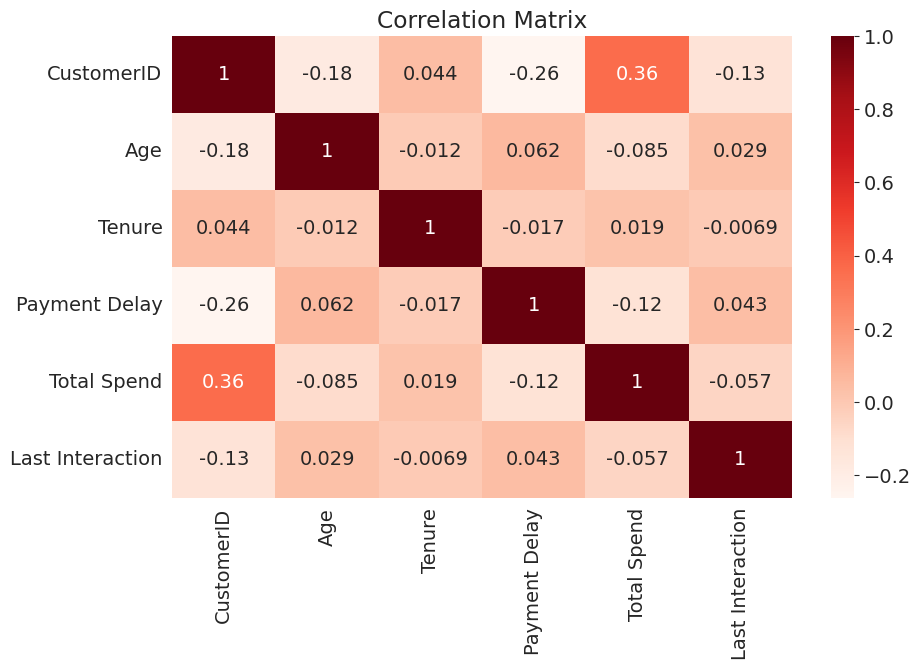

In [54]:
sns.heatmap(customer_df[numeric_cols].corr(), cmap='Reds', annot=True)
plt.title('Correlation Matrix');

We can observe that age 40 - 50 also spend more compared to other ages.


### __Let me do Encoding for Categorical columns.Since I have done some exploratory data analysis for numeric columns.__

In [55]:
customer_df[categorical_cols].nunique()

,0
Gender,2
Subscription Type,3
Contract Length,3
Interaction Rate Category,4


### __Let me import  OneHotEncoder class from sklearn.preprocessing.__



In [56]:
from sklearn.preprocessing import OneHotEncoder

In [57]:
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')

### __First, I fit the encoder to the data i.e.This will identify the full list of categories across all categorical columns.__



In [58]:
encoder.fit(customer_df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse_output=False)

In [59]:
encoder.categories_

[array(['Female', 'Male', nan], dtype=object),
 array(['Basic', 'Premium', 'Standard', nan], dtype=object),
 array(['Annual', 'Monthly', 'Quarterly', nan], dtype=object),
 array(['High', 'Low', 'Medium', 'Undefined'], dtype=object)]

### __*Let me generate column names for each individual category using get_feature_names_out .*__

In [60]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))
print(encoded_cols)

['Gender_Female', 'Gender_Male', 'Gender_nan', 'Subscription Type_Basic', 'Subscription Type_Premium', 'Subscription Type_Standard', 'Subscription Type_nan', 'Contract Length_Annual', 'Contract Length_Monthly', 'Contract Length_Quarterly', 'Contract Length_nan', 'Interaction Rate Category_High', 'Interaction Rate Category_Low', 'Interaction Rate Category_Medium', 'Interaction Rate Category_Undefined']


### __*Now I encode train_inputs,val_inputs and test_inputs using  the transform method of encoder.*__

In [61]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

###__Let me verify that these new columns have been added to my training, test and validation sets.__

In [62]:
test_inputs

,CustomerID,Age,Gender,Tenure,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Interaction Rate Category,Gender_Female,Gender_Male,Gender_nan,Subscription Type_Basic,Subscription Type_Premium,Subscription Type_Standard,Subscription Type_nan,Contract Length_Annual,Contract Length_Monthly,Contract Length_Quarterly,Contract Length_nan,Interaction Rate Category_High,Interaction Rate Category_Low,Interaction Rate Category_Medium,Interaction Rate Category_Undefined
69437,0.157937,0.191489,Male,0.220339,0.533333,Standard,Monthly,0.846667,0.275862,Low,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
224323,0.511537,0.468085,Male,0.305085,0.933333,Standard,Monthly,0.578678,0.689655,High,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
22398,0.049789,0.191489,Female,0.949153,0.800000,Standard,Annual,0.905556,0.862069,Low,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
283708,0.646271,0.468085,Male,0.338983,0.366667,Basic,Annual,0.547589,0.275862,Low,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
167619,0.383176,0.446809,Male,0.966102,0.266667,Standard,Monthly,0.660000,0.482759,Low,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299361,0.681056,0.468085,Male,0.949153,0.533333,Premium,Annual,0.962289,0.172414,Low,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
98270,0.224815,0.893617,Female,0.949153,0.733333,Basic,Monthly,0.301111,0.586207,Medium,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
405319,0.916522,0.425532,Male,0.525424,0.000000,Basic,Annual,0.815933,0.620690,Low,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
108888,0.249448,0.531915,Female,0.118644,0.666667,Premium,Monthly,0.288889,0.655172,Low,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0


## __Let me save my  processed data to disk.__

This will help me to avoid repeating the preprocessing steps every time you start the Jupyter notebook.

I will do this using parquet format since it is a fast and efficient format for saving and loading Pandas dataframes.

In [63]:
print('train_inputs:', train_inputs.shape)
print('train_targets:', train_targets.shape)
print('val_inputs:', val_inputs.shape)
print('val_targets:', val_targets.shape)
print('test_inputs:', test_inputs.shape)
print('test_targets:', test_targets.shape)

train_inputs: (264499, 25)
train_targets: (264499,)
val_inputs: (88167, 25)
val_targets: (88167,)
test_inputs: (88167, 25)
test_targets: (88167,)


In [64]:
!pip install pyarrow --quiet

In [65]:
train_inputs.to_parquet('train_inputs.parquet')
val_inputs.to_parquet('val_inputs.parquet')
test_inputs.to_parquet('test_inputs.parquet')

In [66]:
%%time
pd.DataFrame(train_targets).to_parquet('train_targets.parquet')
pd.DataFrame(val_targets).to_parquet('val_targets.parquet')
pd.DataFrame(test_targets).to_parquet('test_targets.parquet')

CPU times: user 110 ms, sys: 28 ms, total: 138 ms
Wall time: 162 ms


### __Then I read the data back using pd.read_parquet.__

In [67]:
%%time

train_inputs = pd.read_parquet('train_inputs.parquet')
val_inputs = pd.read_parquet('val_inputs.parquet')
test_inputs = pd.read_parquet('test_inputs.parquet')

train_targets = pd.read_parquet('train_targets.parquet')[target_col]
val_targets = pd.read_parquet('val_targets.parquet')[target_col]
test_targets = pd.read_parquet('test_targets.parquet')[target_col]

CPU times: user 330 ms, sys: 147 ms, total: 476 ms
Wall time: 576 ms


### __Let's me verify that the data was loaded properly.__

In [68]:
print('train_inputs:', train_inputs.shape)
print('train_targets:', train_targets.shape)
print('val_inputs:', val_inputs.shape)
print('val_targets:', val_targets.shape)
print('test_inputs:', test_inputs.shape)
print('test_targets:', test_targets.shape)

train_inputs: (264499, 25)
train_targets: (264499,)
val_inputs: (88167, 25)
val_targets: (88167,)
test_inputs: (88167, 25)
test_targets: (88167,)


### __Now I Ttraining a Logistic Regression Model__

### _Let me import LogisticRegression class from Scikit-learn._

In [69]:
from sklearn.linear_model import LogisticRegression

In [70]:
model = LogisticRegression(solver='liblinear')

#### __Now I train my train_inputs data using model.fit.__

In [71]:
model.fit(train_inputs[numeric_cols + encoded_cols], train_targets)

LogisticRegression(solver='liblinear')

In [72]:
print(numeric_cols + encoded_cols)

['CustomerID', 'Age', 'Tenure', 'Payment Delay', 'Total Spend', 'Last Interaction', 'Gender_Female', 'Gender_Male', 'Gender_nan', 'Subscription Type_Basic', 'Subscription Type_Premium', 'Subscription Type_Standard', 'Subscription Type_nan', 'Contract Length_Annual', 'Contract Length_Monthly', 'Contract Length_Quarterly', 'Contract Length_nan', 'Interaction Rate Category_High', 'Interaction Rate Category_Low', 'Interaction Rate Category_Medium', 'Interaction Rate Category_Undefined']


### __Let's check the weights and biases of the trained model.__

In [73]:
print(model.coef_.tolist())

[[-18.950131557459517, 1.7557069028045902, -0.3972287879541158, 2.617343572109357, -4.0008871496754885, 1.3682432226091361, 3.232589491709946, 2.3644219806470232, 0.0, 1.9405408178616952, 1.8280973789379094, 1.828373275561875, 0.0, -0.5887425270125093, 6.776848665026614, -0.5910946656529968, 0.0, 2.5682545725335593, 0.7271119040780254, 2.3016449957490117, 0.0]]


In [74]:
print(model.intercept_)

[5.59701147]


### __*Let me create a dataframe for the weight features.Each weight is applied to the value in a specific column of the input. Higher the weight, greater the impact of the column on the prediction.*__

In [75]:
weight_df = pd.DataFrame({
    "feature": numeric_cols + encoded_cols,
    "weight": model.coef_.tolist()[0]

})

In [76]:
weight_df

,feature,weight
0,CustomerID,-18.950132
1,Age,1.755707
2,Tenure,-0.397229
3,Payment Delay,2.617344
4,Total Spend,-4.000887
5,Last Interaction,1.368243
6,Gender_Female,3.232589
7,Gender_Male,2.364422
8,Gender_nan,0.000000
9,Subscription Type_Basic,1.940541


<Axes: xlabel='weight', ylabel='feature'>

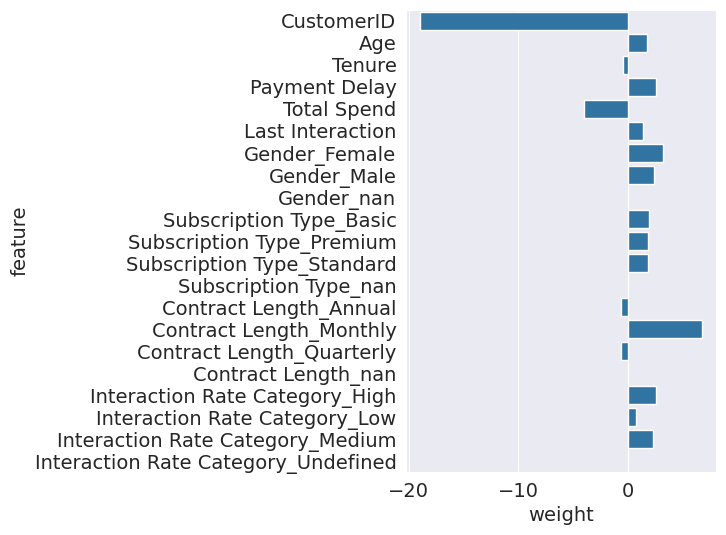

In [77]:
plt.figure(figsize=(4,6))
sns.barplot(data=weight_df, x='weight', y='feature')

We can see that what makes people Churn very easily is the age of the customer followed by payment delay

### __Let me arrange them in ascending order.__

<Axes: xlabel='weight', ylabel='feature'>

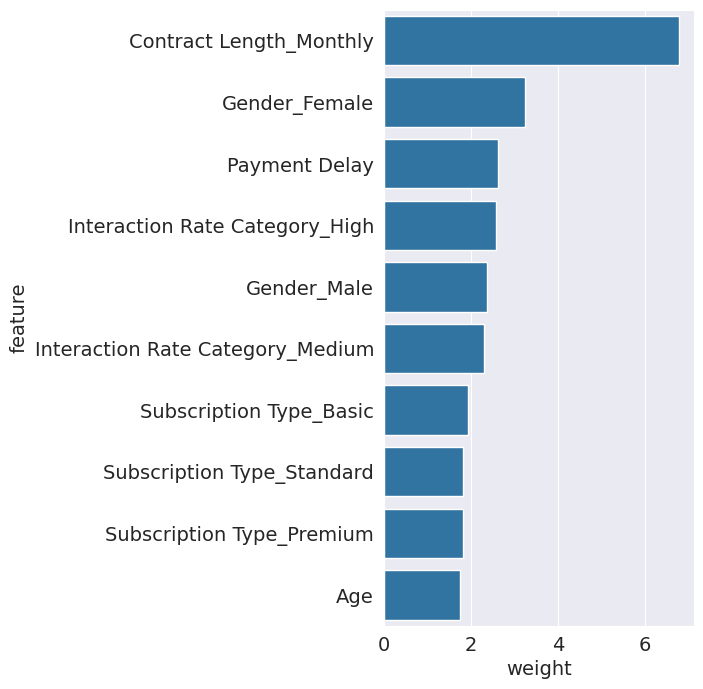

In [78]:
plt.figure(figsize=(4,8))
sns.barplot(data=weight_df.sort_values('weight',ascending = False).head(10), x='weight', y='feature')

### __Now I make my Predictions and Evaluate the Model.__

I will use the trained model to make predictions on the training, test

In [79]:
X_train = train_inputs[numeric_cols + encoded_cols]
X_val = val_inputs[numeric_cols + encoded_cols]
X_test = test_inputs[numeric_cols + encoded_cols]

In [80]:
train_preds = model.predict(X_train)

In [81]:
train_preds

array([1., 1., 1., ..., 0., 1., 1.])

In [82]:
train_targets

,Churn
92057,1.0
211799,1.0
250424,1.0
218255,1.0
236392,1.0
...,...
93160,1.0
186724,1.0
409678,0.0
92223,1.0


In [83]:
val_preds = model.predict(X_val)

In [84]:
val_preds

array([0., 1., 0., ..., 1., 0., 1.])

In [85]:
test_preds = model.predict(X_test)

In [86]:
test_preds

array([1., 1., 1., ..., 0., 1., 0.])

### __Let me output a probabilistic prediction using predict_proba.__

In [87]:
train_probs = model.predict_proba(X_train)
train_probs

array([[4.90878291e-08, 9.99999951e-01],
       [7.55881405e-04, 9.99244119e-01],
       [2.07581917e-01, 7.92418083e-01],
       ...,
       [9.99934206e-01, 6.57939565e-05],
       [1.13470517e-03, 9.98865295e-01],
       [1.11720093e-04, 9.99888280e-01]])

The numbers above indicate the probabilities for the target classes "No" and "Yes".

_I will test the accuracy of the model's predictions by computing the percentage of matching values in train_preds and train_targets._

I will do this  using the accuracy_score function from sklearn.metrics.

In [88]:
from sklearn.metrics import accuracy_score

In [89]:
accuracy_score(train_targets, train_preds)

0.9776672123524096

### __Let me create a Confusion matrix to vie the accuracy.__

In [90]:
from sklearn.metrics import confusion_matrix

In [91]:
confusion_matrix(train_targets, train_preds, normalize='true')

array([[0.97656735, 0.02343265],
       [0.02149434, 0.97850566]])

In [92]:
def predict_and_plot(inputs, targets, name=''):
    preds = model.predict(inputs)

    accuracy = accuracy_score(targets, preds)
    print("Accuracy: {:.2f}%".format(accuracy * 100))

    cf = confusion_matrix(targets, preds, normalize='true')
    plt.figure()
    sns.heatmap(cf, annot=True)
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.title('{} Confusion Matrix'.format(name));

    return preds

Accuracy: 97.77%


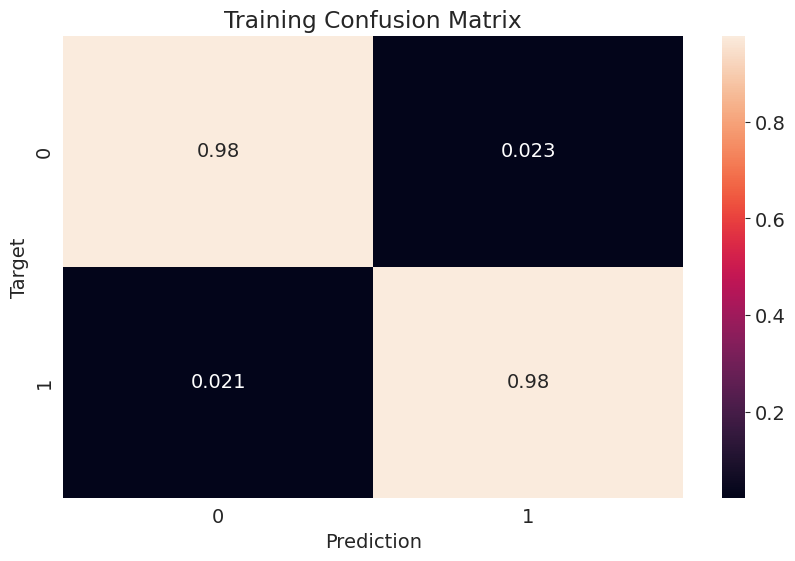

In [93]:
train_preds = predict_and_plot(X_train, train_targets, 'Training')

### __Let me compute the model's accuracy on the validation and test sets too.__

Accuracy: 97.64%


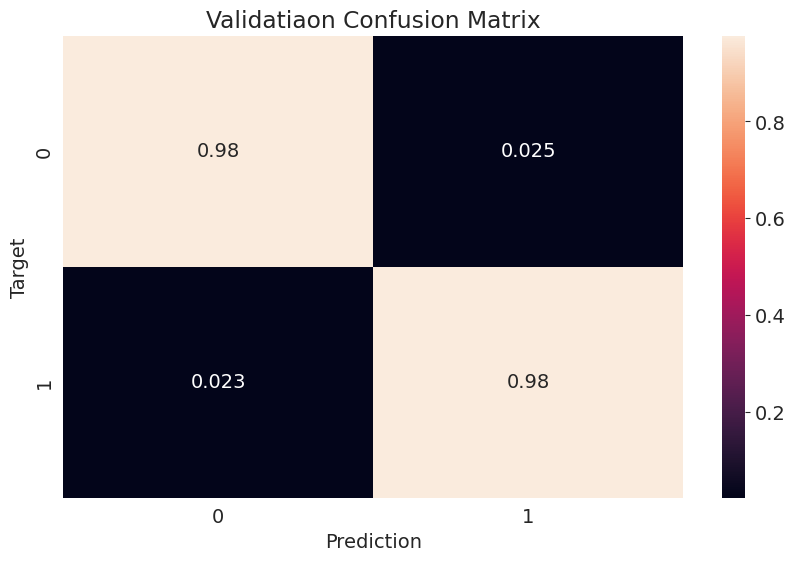

In [94]:
val_preds = predict_and_plot(X_val, val_targets, 'Validatiaon')

Accuracy: 97.74%


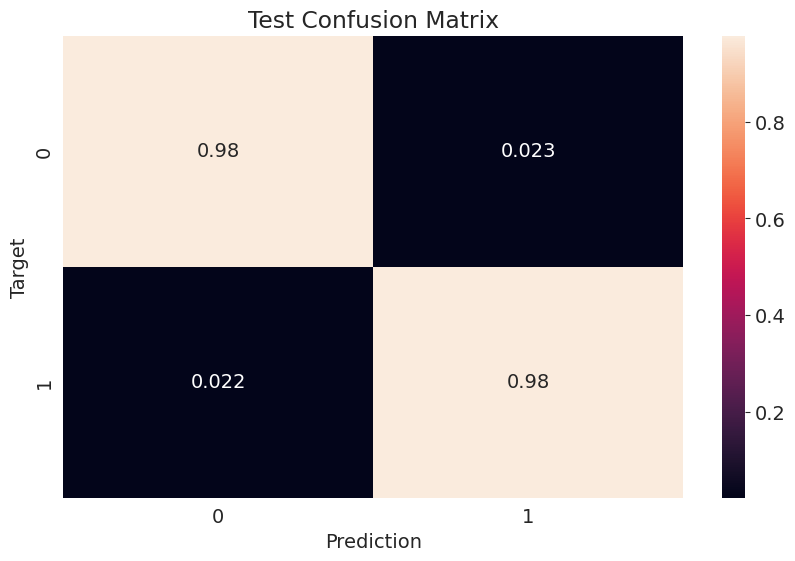

In [95]:
test_preds = predict_and_plot(X_test, test_targets, 'Test')

Evaluating my Model's Performance
The accuracies of your model on the training, validation, and test sets are:



Training Accuracy: 97.77%
Validation Accuracy: 97.64%
Test Accuracy: 97.74%



1. The training, validation, and test accuracies are very close to each other.
2. This indicates that my model generalizes well to unseen data, as there isn't a significant drop in accuracy from training to validation/test sets.

## __Let me draw a learning curve to see if the model is overfitting or underfitting.__

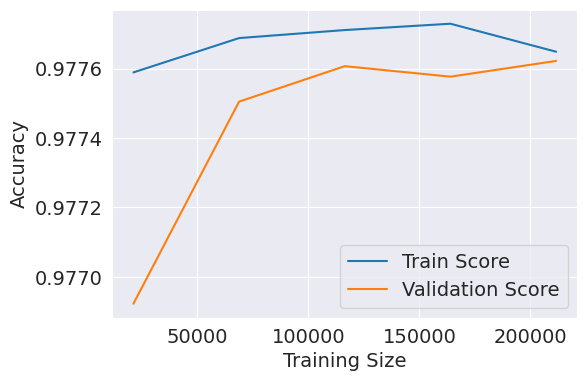

In [96]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt

# Now use X_train for learning curve and evaluation
train_sizes, train_scores, val_scores = learning_curve(model, X_train, train_targets, cv=5)
# Set the figure size (width, height) in inches
plt.figure(figsize=(6, 4))

# Plot the learning curve
plt.plot(train_sizes, train_scores.mean(axis=1), label="Train Score")
plt.plot(train_sizes, val_scores.mean(axis=1), label="Validation Score")
plt.xlabel("Training Size")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


## __Let's create two models: one that guesses randomly and another that always return "No". Both of them completely ignoring the inputs given to them.__

In [97]:
print("Unique test targets:", np.unique(test_targets))


Unique test targets: [0. 1.]


In [98]:
test_targets = np.where(test_targets == 1, "Yes", "No")


__This will help us verify whether a model has actually learned something useful is to compare its results to a "random" or "dumb" model.__

In [99]:
def random_guess(inputs):
  return np.random.choice(["No", "Yes"], size=len(inputs))


In [100]:
def all_no(inputs):
    return np.full(len(inputs), "No")

### __Let's check the accuracies of these two models on the test set.__

In [101]:
accuracy_score(test_targets, random_guess(X_test))

0.4986446176006896

In [102]:
accuracy_score(test_targets, all_no(X_test))

0.43262218290290017

### _My model by far outperforms baselines, which validates its effectiveness._



### __let me convert my test_targets into binary integers again (like 1 and 0)__

In [103]:
test_targets = np.where(test_targets == "Yes", 1, 0)

### __Now let me make Predictions on a Single Input.__

In [104]:
new_input = {'CustomerID':'70709.0',
             'Age':'40.0',
             'Gender':'Male',
             'Tenure':'7.0',
             'Payment Delay':'3.0',
             'Subscription Type':'Basic',
             'Contract Length':	'Quarterly',
             'Total Spend':'600.00',
             'Last Interaction':'20.00',
             'Interaction Rate Category':'High'}


## __Let me convert this dictionary into a Pandas dataframe, similar to raw_df.__

In [105]:
new_input_df = pd.DataFrame([new_input])

In [106]:
new_input_df

,CustomerID,Age,Gender,Tenure,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Interaction Rate Category
0,70709.0,40.0,Male,7.0,3.0,Basic,Quarterly,600.00,20.00,High


__Let me do.__

1. _Imputation of missing values using the imputer created earlier._
2. _Scaling numerical features using the scaler created earlier._
3. _Encoding categorical features using the encoder created earlier._

In [107]:
new_input_df[numeric_cols] = imputer.transform(new_input_df[numeric_cols])
new_input_df[numeric_cols] = scaler.transform(new_input_df[numeric_cols])
new_input_df[encoded_cols] = encoder.transform(new_input_df[categorical_cols])

In [108]:
X_new_input = new_input_df[numeric_cols + encoded_cols]


In [109]:
X_new_input

,CustomerID,Age,Tenure,Payment Delay,Total Spend,Last Interaction,Gender_Female,Gender_Male,Gender_nan,Subscription Type_Basic,Subscription Type_Premium,Subscription Type_Standard,Subscription Type_nan,Contract Length_Annual,Contract Length_Monthly,Contract Length_Quarterly,Contract Length_nan,Interaction Rate Category_High,Interaction Rate Category_Low,Interaction Rate Category_Medium,Interaction Rate Category_Undefined
0,0.157128,0.468085,0.101695,0.1,0.555556,0.655172,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


# __Now make a prediction using model.predict.__

In [110]:
prediction = model.predict(X_new_input)[0]

In [111]:
prediction

1.0

#### __My model states that with the data given above the customer will Churn.__

In [112]:
prob = model.predict_proba(X_new_input)[0]

In [113]:
prob

array([1.80712598e-04, 9.99819287e-01])

##### __There is probability of 99.93% that customer will Churn.Meaning he/she will stop buying from that supplier.__

##__Let's me  define a helper function to make predictions for individual inputs.__

In [114]:
def predict_input(single_input):
    input_df = pd.DataFrame([single_input])
    input_df[numeric_cols] = imputer.transform(input_df[numeric_cols])
    input_df[numeric_cols] = scaler.transform(input_df[numeric_cols])
    input_df[encoded_cols] = encoder.transform(input_df[categorical_cols])
    X_input = input_df[numeric_cols + encoded_cols]
    pred = model.predict(X_input)[0]
    prob = model.predict_proba(X_input)[0][list(model.classes_).index(pred)]
    return pred, prob

### __Let me make predictions for the above input_df__

In [115]:
new_input = {'CustomerID':'70709.0',
             'Age':'40.0',
             'Gender':'Male',
             'Tenure':'7.0',
             'Payment Delay':'3.0',
             'Subscription Type':'Basic',
             'Contract Length':	'Quarterly',
             'Total Spend':'600.00',
             'Last Interaction':'20.00',
             'Interaction Rate Category':'High'}


In [116]:
predict_input(new_input)

(1.0, 0.9998192874019749)

### __Let me save the parameters (weights and biases) of my trained model to disk so that I don't need to retrain the model from scratch each time I wish to use it.__

##### _I will use joblib module to save and load Python objects on the disk._

In [117]:
import joblib
import json

In [118]:
aussie_rain = {
    'model': model,
    'imputer': imputer,
    'scaler': scaler,
    'encoder': encoder
}

# Define numeric and encoded columns
numeric_cols = numeric_cols
encoded_cols = encoded_cols

# Save the model
joblib.dump(aussie_rain['model'], 'aussie_rain_model.pkl')

# Save the preprocessing components
joblib.dump(aussie_rain['imputer'], 'imputer.pkl')
joblib.dump(aussie_rain['scaler'], 'scaler.pkl')
joblib.dump(aussie_rain['encoder'], 'encoder.pkl')

# Save the columns used for training (after encoding)
columns_used_for_training = numeric_cols + encoded_cols
with open('columns_used_for_training.json', 'w') as f:
    json.dump(columns_used_for_training, f)

print("Model and preprocessing components saved successfully.")


Model and preprocessing components saved successfully.


##### __Let me reload back using joblib.load__

In [119]:
# Step 1: Load the model
model = joblib.load('aussie_rain_model.pkl')

# Step 2: Load the preprocessors (imputer, scaler, encoder)
imputer = joblib.load('imputer.pkl')
scaler = joblib.load('scaler.pkl')
encoder = joblib.load('encoder.pkl')

# Step 3: Load the columns used for training
with open('columns_used_for_training.json', 'r') as f:
    columns_used_for_training = json.load(f)

#### __Let me use the loaded model to make predictions on the original test set.__

### Make predictions on the preprocessed X_test.

In [120]:

test_preds2 = aussie_rain['model'].predict(X_test)

In [121]:
# Evaluate the predictions
accuracy_score(test_targets, test_preds2)

0.9773951705286559

### Make predictions on the preprocessed X_train.

In [122]:

train_preds2 = aussie_rain['model'].predict(X_train)

In [123]:
# Evaluate the predictions
accuracy_score(train_targets, train_preds2)

0.9776672123524096

### Make predictions on the preprocessed X_val.

In [124]:
val_preds2 = aussie_rain['model'].predict(X_val)

In [125]:
accuracy_score(val_targets, val_preds2)

0.9764084067735094

#    __NOW I CREATE THE SECOND MODEL.__

# __DECISION TREE.__

Since I am working with the similar data all I need is to get is:

X_train = train_inputs[numeric_cols + encoded_cols]

X_val = val_inputs[numeric_cols + encoded_cols]

X_test = test_inputs[numeric_cols + encoded_cols]

In [126]:
X_train = train_inputs[numeric_cols + encoded_cols]
X_val = val_inputs[numeric_cols + encoded_cols]
X_test = test_inputs[numeric_cols + encoded_cols]

In [127]:
X_train

,CustomerID,Age,Tenure,Payment Delay,Total Spend,Last Interaction,Gender_Female,Gender_Male,Gender_nan,Subscription Type_Basic,Subscription Type_Premium,Subscription Type_Standard,Subscription Type_nan,Contract Length_Annual,Contract Length_Monthly,Contract Length_Quarterly,Contract Length_nan,Interaction Rate Category_High,Interaction Rate Category_Low,Interaction Rate Category_Medium,Interaction Rate Category_Undefined
92057,0.210417,0.127660,0.813559,0.833333,0.010000,0.448276,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
211799,0.482472,0.127660,0.576271,0.300000,0.688378,0.103448,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
250424,0.572137,0.489362,0.355932,0.833333,0.460211,0.241379,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
218255,0.497492,0.404255,0.762712,0.700000,0.656844,0.896552,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
236392,0.539519,0.510638,0.440678,0.966667,0.393133,0.413793,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93160,0.212984,0.957447,0.949153,0.633333,0.586667,0.034483,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
186724,0.425632,0.574468,0.813559,0.233333,0.997778,0.689655,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
409678,0.926208,0.212766,0.237288,0.066667,0.697189,0.241379,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
92223,0.210813,0.595745,0.932203,0.166667,0.782222,0.310345,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0


In [128]:
train_targets

,Churn
92057,1.0
211799,1.0
250424,1.0
218255,1.0
236392,1.0
...,...
93160,1.0
186724,1.0
409678,0.0
92223,1.0


## __Let me use DecisionTreeClassifier from sklearn.tree to train a decision tree.__

In [129]:
from sklearn.tree import DecisionTreeClassifier

In [130]:
model = DecisionTreeClassifier(random_state=42)

In [131]:
%%time
model.fit(X_train, train_targets)

CPU times: user 900 ms, sys: 16.7 ms, total: 917 ms
Wall time: 990 ms


DecisionTreeClassifier(random_state=42)

## __Let's me evaluate the decision tree using the accuracy score..__

In [132]:
from sklearn.metrics import accuracy_score, confusion_matrix

In [133]:
train_preds = model.predict(X_train)

In [134]:
train_preds

array([1., 1., 1., ..., 0., 1., 1.])

In [135]:
pd.value_counts(train_preds)

<ipython-input-135-5a0b2543de7a>:1: FutureWarning:

pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.



,count
1.0,150086
0.0,114413


In [136]:
train_probs = model.predict_proba(X_train)

In [137]:
train_probs

array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [1., 0.],
       [0., 1.],
       [0., 1.]])

### __Let's check the accuracy of its predictions.__

In [138]:
accuracy_score(train_targets, train_preds)

1.0

### __Let use validation to make predictions and compute accuracy in one step using model.score.__

In [139]:
model.score(X_val, val_targets)

0.9904159152517382

In [140]:
val_targets.value_counts() / len(val_targets)

,count
Churn,
1.0,0.565858
0.0,0.434142


### __Let me Visualization my tree.__

In [141]:
from sklearn.tree import plot_tree, export_text

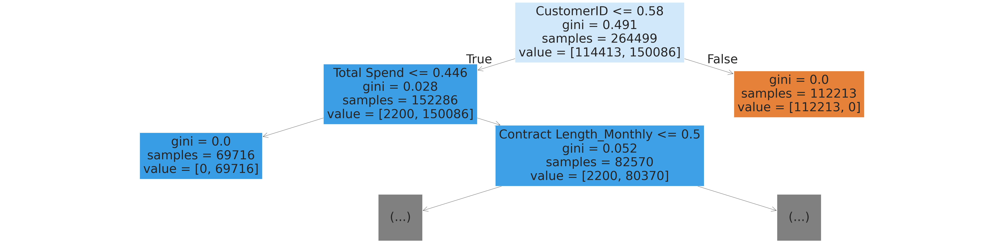

In [142]:
plt.figure(figsize=(80,20))
plot_tree(model, feature_names=X_train.columns, max_depth=2, filled=True);

### __Let me check the depth of the tree that was created.__

In [143]:
model.tree_.max_depth

32

### __Let me also display the tree as text.__

In [144]:
tree_text = export_text(model, max_depth=10, feature_names=list(X_train.columns))
print(tree_text[:5000])

|--- CustomerID <= 0.58
|   |--- Total Spend <= 0.45
|   |   |--- class: 1.0
|   |--- Total Spend >  0.45
|   |   |--- Contract Length_Monthly <= 0.50
|   |   |   |--- Payment Delay <= 0.68
|   |   |   |   |--- Age <= 0.69
|   |   |   |   |   |--- Interaction Rate Category_Low <= 0.50
|   |   |   |   |   |   |--- CustomerID <= 0.33
|   |   |   |   |   |   |   |--- CustomerID <= 0.06
|   |   |   |   |   |   |   |   |--- CustomerID <= 0.06
|   |   |   |   |   |   |   |   |   |--- Age <= 0.27
|   |   |   |   |   |   |   |   |   |   |--- class: 1.0
|   |   |   |   |   |   |   |   |   |--- Age >  0.27
|   |   |   |   |   |   |   |   |   |   |--- Last Interaction <= 0.16
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 10
|   |   |   |   |   |   |   |   |   |   |--- Last Interaction >  0.16
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 13
|   |   |   |   |   |   |   |   |--- CustomerID >  0.06
|   |   |   |   |   |   |   |   |   |--- cla

### __Let me check Feature Importance.__

In [145]:
model.feature_importances_

array([9.76179051e-01, 3.70581439e-03, 3.26351509e-03, 3.21417347e-03,
       4.17764462e-03, 4.24220257e-03, 1.59317350e-03, 9.98528517e-05,
       0.00000000e+00, 4.46507174e-04, 3.99469090e-04, 4.68405700e-04,
       0.00000000e+00, 2.37863774e-04, 4.90021863e-04, 2.34717381e-04,
       0.00000000e+00, 2.25912312e-05, 1.19276904e-03, 3.22277113e-05,
       0.00000000e+00])

### __Let me create a dataframe and visualize the most important features.__

In [146]:
importance_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

In [147]:
importance_df.head(10)

,feature,importance
0,CustomerID,0.976179
5,Last Interaction,0.004242
4,Total Spend,0.004178
1,Age,0.003706
2,Tenure,0.003264
3,Payment Delay,0.003214
6,Gender_Female,0.001593
18,Interaction Rate Category_Low,0.001193
14,Contract Length_Monthly,0.000490
11,Subscription Type_Standard,0.000468


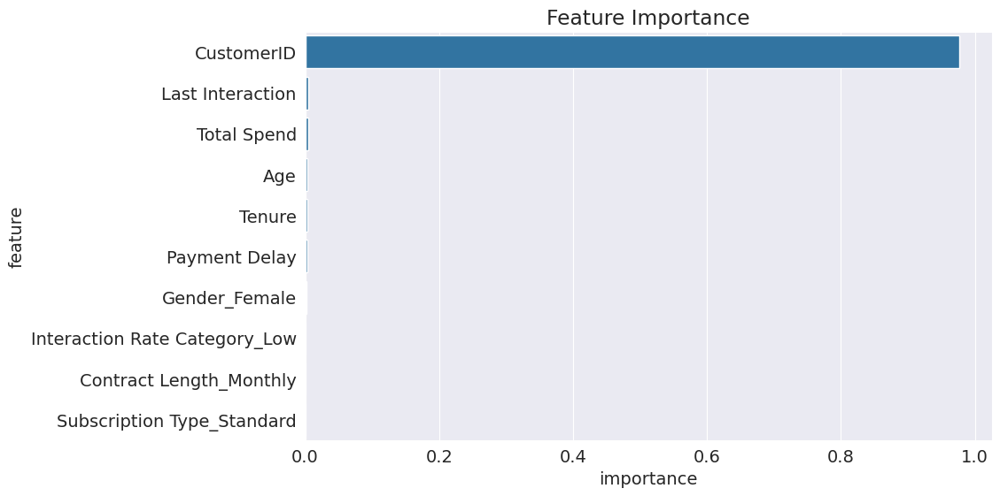

In [148]:
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

### __Let me do Hyperparameter Tuning and Overfitting.__


### I will explore two hyperparameter tuning.


max_depth

max_leaf_nodes

## __Max_depth.__

By reducing the maximum depth of the decision tree, I can prevent the tree from memorizing all training examples, which may lead to better generalization.

In [149]:
model = DecisionTreeClassifier(max_depth=3, random_state=42)

In [150]:
model.fit(X_train, train_targets)

DecisionTreeClassifier(max_depth=3, random_state=42)

### __Let me compute the accuracy of the model on the training and validation sets using model.score.__

In [151]:
model.score(X_train, train_targets)

0.991682388213188

In [152]:
model.score(X_val, val_targets)

0.9913913368947566

The training accuracy of the model and validation accuraccy now is 0.99%

In [153]:
model.classes_

array([0., 1.])

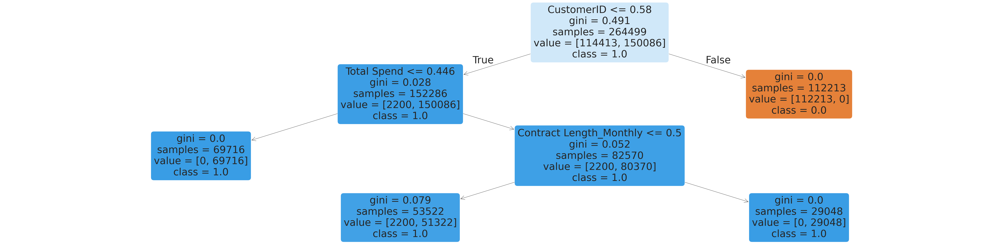

In [154]:
# Convert class names to strings
class_names = [str(cls) for cls in model.classes_]

# Plot the decision tree
plt.figure(figsize=(80, 20))
plot_tree(model, feature_names=X_train.columns, filled=True, rounded=True, class_names=class_names);
plt.show()

In [155]:
print(export_text(model, feature_names=list(X_train.columns)))

|--- CustomerID <= 0.58
|   |--- Total Spend <= 0.45
|   |   |--- class: 1.0
|   |--- Total Spend >  0.45
|   |   |--- Contract Length_Monthly <= 0.50
|   |   |   |--- class: 1.0
|   |   |--- Contract Length_Monthly >  0.50
|   |   |   |--- class: 1.0
|--- CustomerID >  0.58
|   |--- class: 0.0



### __Let's me experiment with different depths using a helper function.__

In [156]:
def max_depth_error(md):
    model = DecisionTreeClassifier(max_depth=md, random_state=42)
    model.fit(X_train, train_targets)
    train_acc = 1 - model.score(X_train, train_targets)
    val_acc = 1 - model.score(X_val, val_targets)
    return {'Max Depth': md, 'Training Error': train_acc, 'Validation Error': val_acc}

In [157]:
%%time
errors_df = pd.DataFrame([max_depth_error(md) for md in range(1, 21)])

CPU times: user 13.5 s, sys: 30.3 ms, total: 13.5 s
Wall time: 13.6 s


In [158]:
errors_df

,Max Depth,Training Error,Validation Error
0,1,0.008318,0.008609
1,2,0.008318,0.008609
2,3,0.008318,0.008609
3,4,0.008318,0.008609
4,5,0.008318,0.008609
5,6,0.008318,0.008609
6,7,0.008318,0.008609
7,8,0.008318,0.008609
8,9,0.008291,0.008382
9,10,0.008117,0.008359


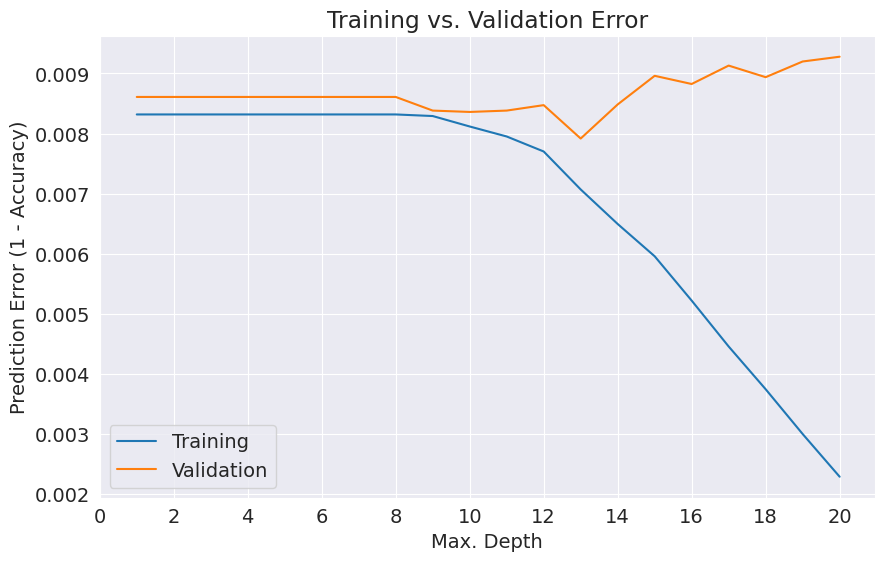

In [159]:
plt.figure()
plt.plot(errors_df['Max Depth'], errors_df['Training Error'])
plt.plot(errors_df['Max Depth'], errors_df['Validation Error'])
plt.title('Training vs. Validation Error')
plt.xticks(range(0,21, 2))
plt.xlabel('Max. Depth')
plt.ylabel('Prediction Error (1 - Accuracy)')
plt.legend(['Training', 'Validation'])

### __It appears that a maximum depth of 9 results in the lowest validation error.__

In [160]:
model = DecisionTreeClassifier(max_depth=9, random_state=42).fit(X_train, train_targets)
model.score(X_val, val_targets)

0.991618179137319

### __Let me also use Max_leaf_nodes.__

In [161]:
model = DecisionTreeClassifier(max_leaf_nodes=128, random_state=42)

In [162]:
model.fit(X_train, train_targets)

DecisionTreeClassifier(max_leaf_nodes=128, random_state=42)

In [163]:
model.score(X_train, train_targets)

0.9938563094756502

In [164]:
model.score(X_val, val_targets)

0.9917996529313688

In [165]:
model.tree_.max_depth

20

# __LET ME TRAIN MY DATA ON RADOM FOREST MODEL.__

### __Let me use RandomForestClassifier class from sklearn.ensemble.__

In [166]:
from sklearn.ensemble import RandomForestClassifier

In [167]:
model = RandomForestClassifier(n_jobs=-1, random_state=42)

n_jobs allows the random forest to use mutiple parallel workers to train decision trees, and random_state=42 ensures that the we get the same results for each execution.

In [168]:
%%time
model.fit(X_train, train_targets)

CPU times: user 32.9 s, sys: 145 ms, total: 33.1 s
Wall time: 19.2 s


RandomForestClassifier(n_jobs=-1, random_state=42)

In [169]:
model.score(X_train, train_targets)

1.0

In [170]:
model.score(X_val, val_targets)

0.9915954949130628

The training accuracy is almost 100%, but this time the validation accuracy is 0.9915954949130628 below the trainning accuracy.

### __Let me also look at the probabilities for the predictions.__

In [171]:
train_probs = model.predict_proba(X_train)
train_probs

array([[0.  , 1.  ],
       [0.  , 1.  ],
       [0.  , 1.  ],
       ...,
       [1.  , 0.  ],
       [0.01, 0.99],
       [0.  , 1.  ]])

### __Let me also access individual decision trees using model.estimators___

In [172]:
model.estimators_[0]

DecisionTreeClassifier(max_features='sqrt', random_state=1608637542)

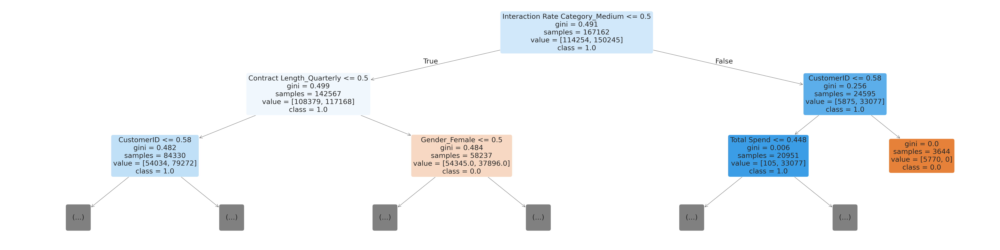

In [173]:
# Ensure class names are strings
class_names = [str(cls) for cls in model.classes_]

# Plot the first tree from the ensemble model with limited depth
plt.figure(figsize=(80, 20))
plot_tree(model.estimators_[0], max_depth=2, feature_names=X_train.columns, filled=True, rounded=True, class_names=class_names);
plt.show()

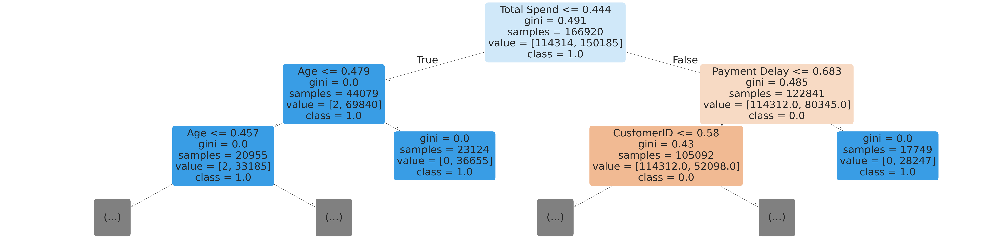

In [174]:
# Ensure class names are strings
class_names = [str(cls) for cls in model.classes_]

# Plot a specific tree from the ensemble model
plt.figure(figsize=(80, 20))
plot_tree(model.estimators_[20], max_depth=2, feature_names=X_train.columns, filled=True, rounded=True, class_names=class_names);
plt.show()

#### __Let me create a dataframe for the   "importance" to each feature, for the random forest.__

In [175]:
importance_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

In [176]:
importance_df.head(10)

,feature,importance
0,CustomerID,0.616537
4,Total Spend,0.125445
3,Payment Delay,0.068050
14,Contract Length_Monthly,0.061711
1,Age,0.057381
18,Interaction Rate Category_Low,0.018283
5,Last Interaction,0.014034
19,Interaction Rate Category_Medium,0.007042
6,Gender_Female,0.006922
7,Gender_Male,0.005509


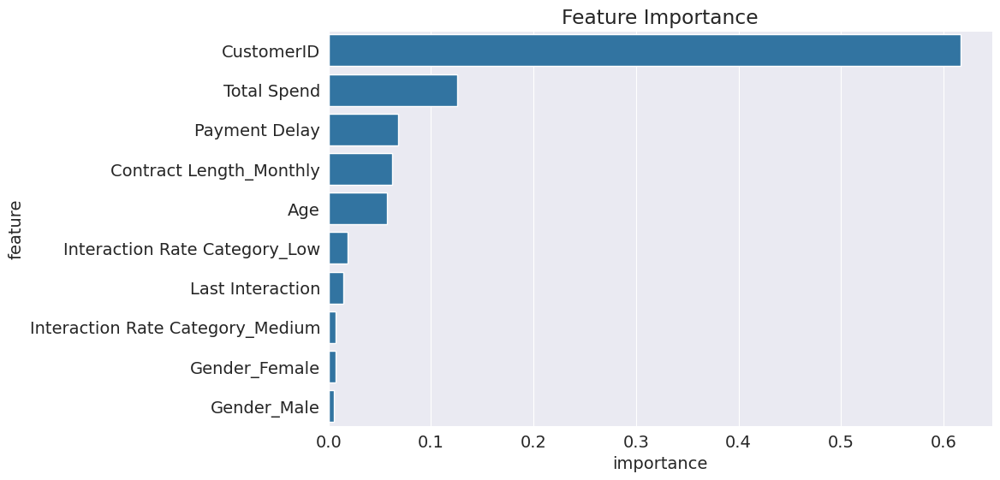

In [177]:
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

## __Let me do Hyperparameter Tuning with Random Forests.__

### __Let me create a base model with which we can compare models with tuned hyperparameters.__

In [178]:
base_model = RandomForestClassifier(random_state=42, n_jobs=-1).fit(X_train, train_targets)

In [179]:
base_train_acc = base_model.score(X_train, train_targets)
base_val_acc = base_model.score(X_val, val_targets)

In [180]:
base_accs = base_train_acc, base_val_acc
base_accs

(1.0, 0.9915954949130628)

I will use this benchmark for hyperparmeter tuning.

## __Let me start with (n_estimators)__

__Let me see 10 estimators__

In [181]:
model = RandomForestClassifier(random_state=42, n_jobs=-1, n_estimators=10)

In [182]:
model.fit(X_train, train_targets)

RandomForestClassifier(n_estimators=10, n_jobs=-1, random_state=42)

In [183]:
model.score(X_train, train_targets), model.score(X_val, val_targets)

(0.9997088835874616, 0.9914820737917815)

In [184]:
base_accs

(1.0, 0.9915954949130628)

__Let me try 500 estimators__

In [185]:
model = RandomForestClassifier(random_state=42, n_jobs=-1, n_estimators=500)
model.fit(X_train, train_targets)

RandomForestClassifier(n_estimators=500, n_jobs=-1, random_state=42)

In [186]:
model.score(X_train, train_targets)

1.0

In [187]:
model.score(X_val, val_targets)

0.9916862318100876

In [188]:
base_accs

(1.0, 0.9915954949130628)

## __Let me define a function test_params to make it easy to test hyperparameters.__

In [189]:
def test_params(**params):
    model = RandomForestClassifier(random_state=42, n_jobs=-1, **params).fit(X_train, train_targets)
    return model.score(X_train, train_targets), model.score(X_val, val_targets)

In [190]:
test_params(max_depth=5)

(0.991682388213188, 0.9914026790068846)

## __Let me try bootstrap, max_samples.__

In [191]:
test_params(bootstrap=False)

(1.0, 0.9916748896979596)

In [192]:
base_accs

(1.0, 0.9915954949130628)

## __Let me see class_weight.__

In [193]:
model.classes_

array([0., 1.])

In [194]:
test_params(class_weight='balanced')

(1.0, 0.9915387843524222)

In [195]:
base_accs

(1.0, 0.9915954949130628)

## __Let's train a random forest with customized hyperparameters based on my learnings.__

In [196]:
model = RandomForestClassifier(n_jobs=-1,
                               random_state=42,
                               n_estimators=1000,
                               max_features=7,
                               max_depth=30,
                               class_weight={0.0: 0.7, 1.0: 0.3})

In [197]:
model.fit(X_train, train_targets)

RandomForestClassifier(class_weight={0.0: 0.7, 1.0: 0.3}, max_depth=30,
                       max_features=7, n_estimators=1000, n_jobs=-1,
                       random_state=42)

In [198]:
model.score(X_train, train_targets), model.score(X_val, val_targets)

(1.0, 0.9920378372860594)

In [199]:
base_accs

(1.0, 0.9915954949130628)

### __let's also compute the accuracy of our model on the test set.__

In [200]:
model.score(X_test, test_targets)

0.9921739426315969

## __Let me making predictions on new inputs.__

_Let's me define a helper function to make predictions on new inputs._

In [201]:
def predict_input(model, single_input):
    input_df = pd.DataFrame([single_input])
    input_df[numeric_cols] = imputer.transform(input_df[numeric_cols])
    input_df[numeric_cols] = scaler.transform(input_df[numeric_cols])
    input_df[encoded_cols] = encoder.transform(input_df[categorical_cols])
    X_input = input_df[numeric_cols + encoded_cols]
    pred = model.predict(X_input)[0]
    prob = model.predict_proba(X_input)[0][list(model.classes_).index(pred)]
    return pred, prob

In [202]:
new_input = {'CustomerID':'70709.0',
             'Age':'40.0',
             'Gender':'Male',
             'Tenure':'7.0',
             'Payment Delay':'3.0',
             'Subscription Type':'Basic',
             'Contract Length':	'Quarterly',
             'Total Spend':'600.00',
             'Last Interaction':'20.00',
             'Interaction Rate Category':'High'}


In [203]:
new_input_df = pd.DataFrame([new_input])

In [204]:
new_input_df

,CustomerID,Age,Gender,Tenure,Payment Delay,Subscription Type,Contract Length,Total Spend,Last Interaction,Interaction Rate Category
0,70709.0,40.0,Male,7.0,3.0,Basic,Quarterly,600.00,20.00,High


In [205]:
predict_input(model, new_input)

(1.0, 0.995)

## __Let me saving and loading trained models.__

In [206]:
import joblib

In [207]:
aussie_rain = {
    'model': model,
    'imputer': imputer,
    'scaler': scaler,
    'encoder': encoder,
    'input_cols': input_cols,
    'target_col': target_col,
    'numeric_cols': numeric_cols,
    'categorical_cols': categorical_cols,
    'encoded_cols': encoded_cols
}

In [208]:
joblib.dump(aussie_rain, 'aussie_rain.joblib')

['aussie_rain.joblib']

In [209]:
aussie_rain2 = joblib.load('aussie_rain.joblib')

In [210]:
test_preds2 = aussie_rain2['model'].predict(X_test)
accuracy_score(test_targets, test_preds2)

0.9921739426315969

### __MY OBSERVATIONS FOR THE THREE MODELS.__
1. Logitic Model
2. Decision Tree
3. Random Forest

#### __Logistic Model.__

Accuracy_score(train_targets,train_preds)
:97.8%

###### __The Training Confusion Matrix.__
###### __train_preds__
Accuracy:97.64%
###### __val_preds__
Accuracy:97.64%
###### __test_preds__
Accuracy:97.74%

### __Decision Tree.__

model.score(X_train,train_targets):99.2%

model.score(X_val,val_targets):99.1%


#### __After changing hyperparamenters.__
##### __max_depth = 9__
model.score(X_val, val_targets):99.3%


#### __After changing parameters.__
#### __max_leaf_nodes = 128__
model.score(X_train, train_targets):99.4%
model.score(X_val,Val_targets):99.3%

### __Random Forest__

Model.score(X_train,train_targets):100%
Model.score(X_val,Val_targets):99.2%



#### __With Baseline 100% 99.2%__

#### __When I change parameters__
#### __n_estimators = 10__

model.score(X_train, train_targets):99.97%
model.score(X-val,val_targets):99.1%

#### __When I change parameters__
#### __n_estimators = 500__

model.score(X_train, train_targets):100%
model.score(X-val,val_targets):99.2%

#### __When I change parameters__

#### __n_estimators=1000,__
#### __max_features=7,__
#### __max_depth=30,__
#### __class_weight={0.0: 0.7, 1.0: 0.3})__

model.score(X_train, train_targets):100%

model.score(X-val,val_targets):99.2%


#### 1. __I notice that there is model improvement from logistic regression with 97.64% to decision tree with 97.8% to random forest with 100%.__

#### 2. __Increase in n_estimators there is increase in performance of the model.__

#### 3. __Increase in max_leaf_nodes there is increase in performance of the model.__